# Analiza Zachowań Użytkowników Smartfonów
Temat: Przewidywanie wieku użytkownika na podstawie metryk aktywności cyfrowej.

Zbiór danych: Smartphone Usage and Behavioral Dataset (Kaggle)

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('mobile_usage_behavioral_analysis.csv')


Zbiór danych zawiera informacje o:
* Danych demograficznych: Wiek, Płeć, Lokalizacja.
* Metrykach użycia: Czas przed ekranem, liczba aplikacji, całkowity czas użytkowania.
* Kategoriach aplikacji: Media społecznościowe, Produktywność, Gry (w godzinach).

In [2]:
df.head()

,User_ID,Age,Gender,Total_App_Usage_Hours,Daily_Screen_Time_Hours,Number_of_Apps_Used,Social_Media_Usage_Hours,Productivity_App_Usage_Hours,Gaming_App_Usage_Hours,Location
0,1,56,Male,2.61,7.15,24,4.43,0.55,2.40,Los Angeles
1,2,46,Male,2.13,13.79,18,4.67,4.42,2.43,Chicago
2,3,32,Female,7.28,4.50,11,4.58,1.71,2.83,Houston
3,4,25,Female,1.20,6.29,21,3.18,3.42,4.58,Phoenix
4,5,38,Male,6.31,12.59,14,3.15,0.13,4.00,New York


In [3]:
#Analizę aksploracyjna (statystyki opisowe, korelacje):  
#kompletność, odchylenia standardowe, średnie, korelacje.  

In [4]:
onlyNums = df.drop(columns=["User_ID", "Gender", "Location"])

d = pd.DataFrame(columns=onlyNums.columns)
srednie = []
mediany = []
odchylenia = []
kompletnosc = []
for f in range(0, onlyNums.shape[1]):
    kolumna = onlyNums.iloc[:, f]
    srednie.append(round(kolumna.mean(), 2))
    mediany.append(round(kolumna.median(), 2))
    odchylenia.append(round(kolumna.std(), 2)) 
    procent_brakow = (kolumna.count() / len(kolumna)) * 100
    kompletnosc.append(f"{procent_brakow:.2f}%")
d.loc["średnia"] = srednie
d.loc["mediana"] = mediany
d.loc["odchylenie_std"] = odchylenia
d.loc["kompletność"] = kompletnosc

### Wyznaczenie statystyk opisowych i weryfikacja jakości danych

W tej części dokonujemy wstępnej obróbki danych oraz analizy statystycznej. Proces obejmuje:
* Czyszczenie danych: Usunięcie kolumn nieistotnych statystycznie dla modeli regresji (`User_ID`, `Gender`, `Location`) za pomocą metody drop().
* Obliczanie miar tendencji centralnej: Wyznaczenie **średniej** oraz **mediany** dla każdej cechy numerycznej metodą mean() oraz median(), co pozwala określić rozkład danych.
* Analiza rozproszenia: Obliczenie **odchylenia standardowego** metodą std(). Wszystkie wartości zostały zaokrąglone do dwóch miejsc po przecinku dla zwiększenia czytelności.
* Weryfikacja kompletności: Sprawdzenie procentowego wypełnienia zbioru (braków danych). 

Wynikowa tabela pozwala na szybką ocenę danych oraz potwierdzenie czy wymagają dalszego czyszczenia.

In [5]:
print("Statystyki Opisowe")
display(d)

Statystyki Opisowe


,Age,Total_App_Usage_Hours,Daily_Screen_Time_Hours,Number_of_Apps_Used,Social_Media_Usage_Hours,Productivity_App_Usage_Hours,Gaming_App_Usage_Hours
średnia,38.74,6.41,7.7,16.65,2.46,2.5,2.48
mediana,40.0,6.46,7.88,17.0,2.45,2.44,2.46
odchylenie_std,12.19,3.13,3.71,7.62,1.44,1.44,1.45
kompletność,100.00%,100.00%,100.00%,100.00%,100.00%,100.00%,100.00%


#### Wnioski ze statystyk opisowych:
Jakość danych: Zbiór danych jest kompletny (100% wypełnienia dla każdej kolumny), co eliminuje konieczność dlaszego czyszczenia danych.

Charakterystyka grupy: Średni wiek badanego użytkownika to ok. 39 lat, przy czym mediana (40 lat) jest zbliżona do średniej, co sugeruje rozkład zbliżony do normalnego.

Użytkownicy spędzają średnio 7.7 godziny dziennie przed ekranem. Czas ten rozkłada się niemal równomiernie pomiędzy gry, media społecznościowe i aplikacje biurowe (po ok. 2.5h na każdą kategorię).



Obliczenie macierzy korelacji za pomocą metody `.corr()`, aby sprawdzić, które nawyki użytkowania smartfona mają największy wpływ na wiek użytkownika.

In [6]:
print("\nMacierz Korelacji"); onlyNums.corr()


Macierz Korelacji


,Age,Total_App_Usage_Hours,Daily_Screen_Time_Hours,Number_of_Apps_Used,Social_Media_Usage_Hours,Productivity_App_Usage_Hours,Gaming_App_Usage_Hours
Age,1.000000,-0.003319,-0.017639,-0.002081,-0.008324,0.005848,-0.012969
Total_App_Usage_Hours,-0.003319,1.000000,0.002948,0.041493,0.019330,-0.009983,-0.067770
Daily_Screen_Time_Hours,-0.017639,0.002948,1.000000,0.016835,0.031773,0.033206,-0.012984
Number_of_Apps_Used,-0.002081,0.041493,0.016835,1.000000,0.017789,-0.007814,0.019468
Social_Media_Usage_Hours,-0.008324,0.019330,0.031773,0.017789,1.000000,-0.076456,0.006217
Productivity_App_Usage_Hours,0.005848,-0.009983,0.033206,-0.007814,-0.076456,1.000000,0.027217
Gaming_App_Usage_Hours,-0.012969,-0.067770,-0.012984,0.019468,0.006217,0.027217,1.000000


#### Wnioski z Macierzy Korealcji:
Brak zależności liniowych: Wszystkie współczynniki korelacji w odniesieniu do wieku (Age) oscylują w granicach -0.01 do 0.01. W statystyce wartości te uznaje się za brak korelacji.
Niesię to ze sobą istotne wnioski dla całego procesu badawczego.

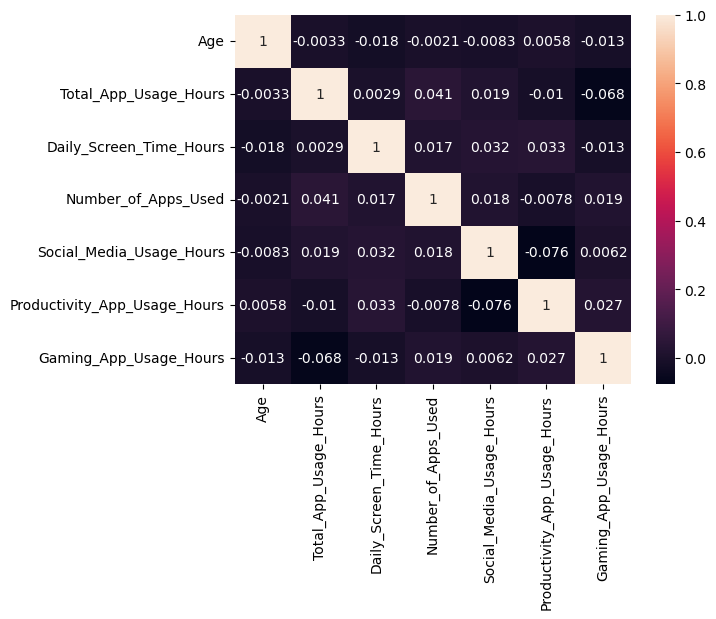

In [7]:
sns.heatmap(onlyNums.corr(),annot = onlyNums.corr());  plt.show() # w postaci mapy ciepła

In [8]:
def divideIntoGroups_thenDrop(group_count, group_size, group_by, group_name, df, to_drop): #Grupy muszą być równoliczne żeby histogramy były właściwe)
    df2 = df.sort_values(group_by).reset_index(drop=True).copy()
    for i in range(0,group_count):
        base = i*group_size
        last_idx = base + group_size - 1;  df2.loc[base:last_idx, group_name] = str(df2.loc[base, group_by]) + "-" + str(df2.loc[last_idx, group_by])
    return df2.drop(columns=to_drop) # drop() dopiero teraz, żeby móc upuścić kolumnę użytą do grupowania

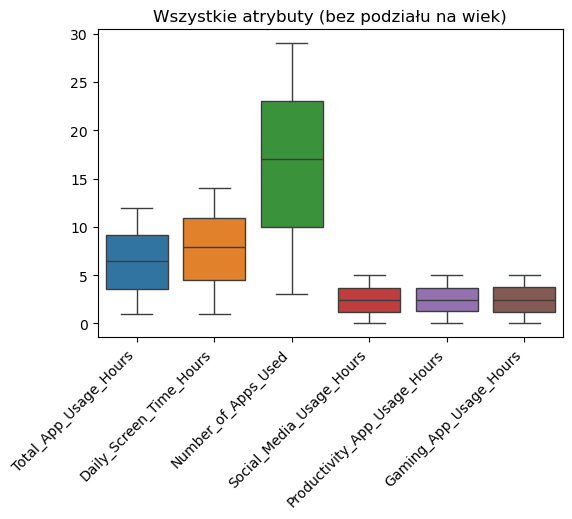

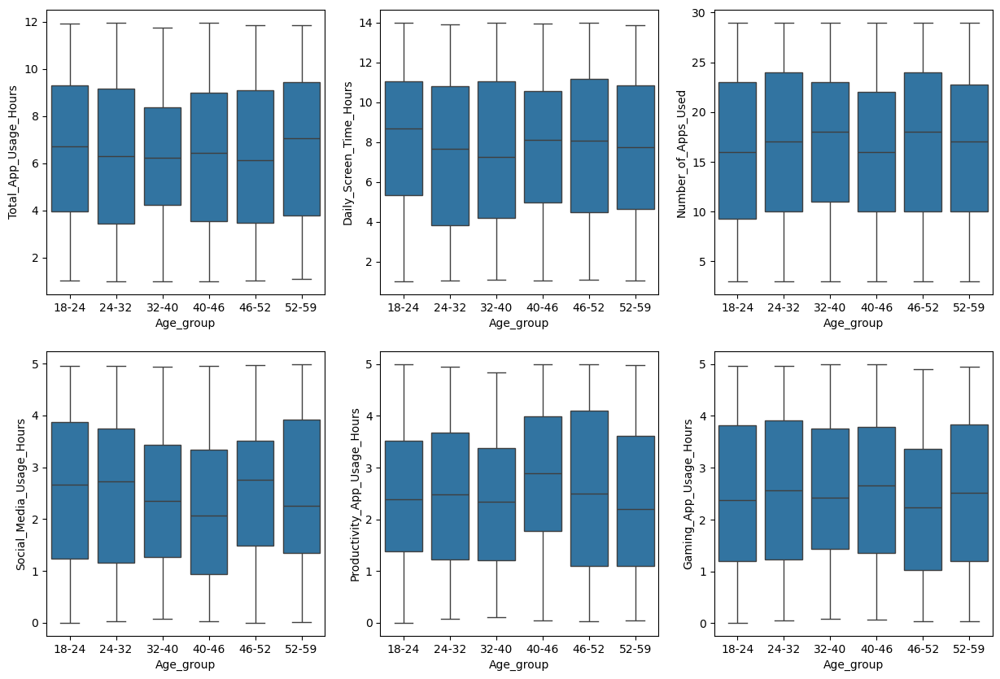

In [9]:
df2 = divideIntoGroups_thenDrop(6, 166, "Age", "Age_group", df, ["User_ID", "Age", "Gender", "Location"]);  plt.figure(figsize=(6,4), dpi= 100)
sns.boxplot(data=df2.drop(columns="Age_group"))
plt.title("Wszystkie atrybuty (bez podziału na wiek)");  plt.xticks(rotation=45, ha="right") #przekręca podpisy żeby na siebie nie nachodziły

plt.figure(figsize=(15,10), dpi= 100)
for i in range(0, df2.shape[1] - 1): # ostatni indeks to Age_group
    plt.subplot(2,3,i+1);  sns.boxplot(x="Age_group", y=df2.columns[i], data=df2)

Na podstawie wykresu pudełkowego wszystkich atrybutów łatwo spostrzec, że atrybutem o największym zakresie zmienności jest ilość używanych aplikacji.  
Natomiast wykresy pudełkowe poszczególnych cech mogą posłużyć do następujących obserwacji:  
Całkowity czas użytkowania aplikacji -  
Całkowity czas spędzony przed ekranem -  
Ilość używanych aplikacji -  
Czas spędzony w mediach społecznościowych -  
Czas spędzony w aplikacjach "produktywnych" -  
Czas spędzony w grach -  


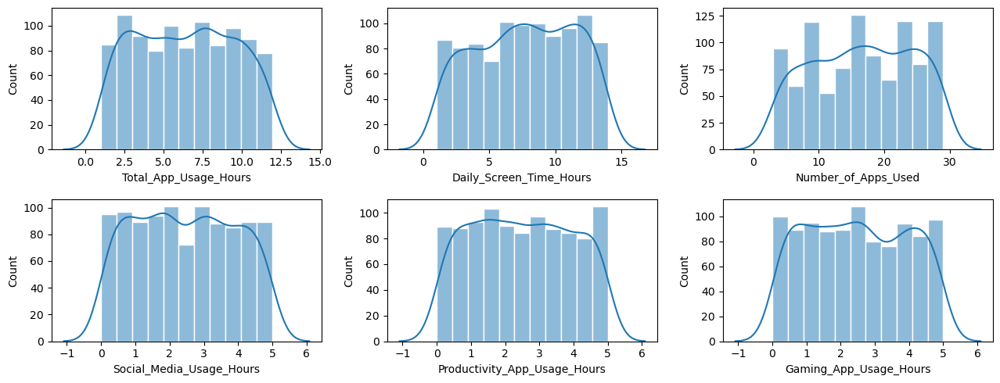

In [10]:
plt.figure(figsize=(13,5), dpi= 100)
for i in range(0, df2.shape[1] - 1):
    plt.subplot(2,3,i+1);  plt.tight_layout();  sns.histplot(df.loc[:,df2.columns[i]], edgecolor='white', kde=True, kde_kws=dict(cut=3))

Na podstawie histogramów bez podziału na grupy wiekowe, raczej trudno dowiedzieć się wiele wartościowych informacji. Można jednak zauważyć i opisać przynajmniej kilka aspektów:
1. Liczby wystąpień poszczególnych wartości są zaskakująco równomierne dla praktycznie wsystkich cech
2. Jedynym atrybutem zachowującym się interesująco na tle innych jest ilość używanych aplikacji. Jej uśredniony rozkład jest dość równomierny, tak jak dla pozostałych cech - ale w tym przypadku istnieją pewne obszary "zagęszczeń" i "rozrzedzeń" odnotowanej liczby wystąpień, nadając histogramowi ciekawy kształt strzelistych wzniesień. To może być podstawą do głębszych przemyśleń, dlaczego o wiele więcej ludzi używa 17 lub 11 aplikacji niż 13, 14 czy 15. Jednak rozmyślania nad tym fenomenem zachodzą już w sferę czysto spekulacyjną, dlatego nie będzie tu wnikliwiej omawiany.

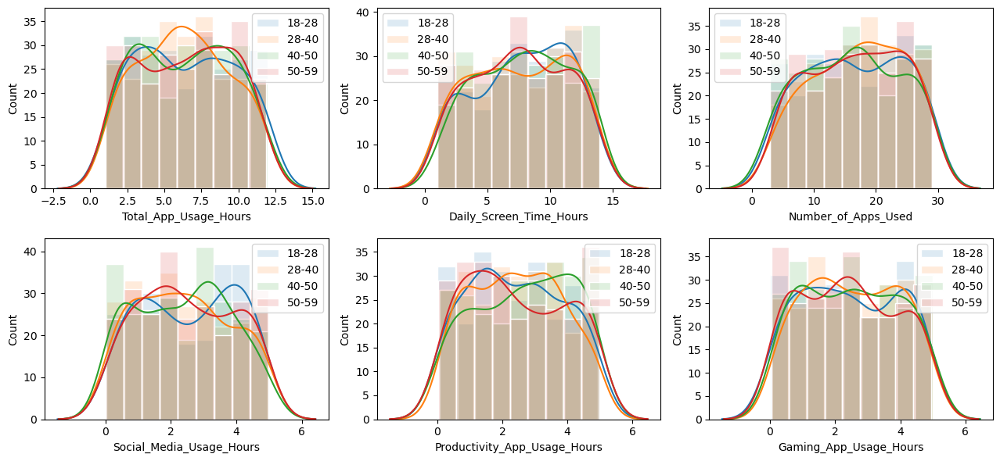

In [11]:
def pokaz_jeden_atrybut(atrybut):
    for c in df2["Age_group"].unique():
        sns.histplot(df2.loc[df2["Age_group"] == c, atrybut], label=c, edgecolor="white", alpha=0.15, kde=True,kde_kws=dict(cut=3))
    plt.legend()  #alpha ustawia przezroczystość słupków, ma małą wartość żeby linie były dobrze widoczne

df2 = divideIntoGroups_thenDrop(4, 250, "Age", "Age_group", df, ["User_ID", "Age", "Gender", "Location"]);  plt.figure(figsize=(13,6), dpi= 100)
for i in range(0, df2.shape[1] - 1):
    plt.subplot(2,3,i+1);  plt.tight_layout();  pokaz_jeden_atrybut(df2.columns[i])

Histogramy z podziałem na grupy wiekowe w większości przypadków ponownie ukazują w miarę równomierny rozkład ogólny. Poszczególne grupy wiekowe mają  wartości bliskie sobie, występuje dużo fluktuacji i mniejszych odchyleń, ale czasami różnice są mimo wszystko zauważalne. Poniżej znajduje się lista najciekawszych przypadków i spostrzeżeń:  
1. Całkowity czas używania aplikacji dla większości przedziałów grupowych przyjmuje następujący schemat - dużo osób korzysta z aplikacji względnie krótko lub dość długo, z lekkim spadkiem w histogramie w wartościach środkowych. Jest jednak wyjątek od tej reguły, ponieważ grupa wiekowa 28-40 dla wartości środkowych przyjmuje właśnie swój wyrazisty szczyt, zauważalnie wyższy niż wykresy reszty grup nawet dla wartości bardziej skrajnych.
2. Histogramy o największej zgodności wszystkich grup (najbardziej zbliżone wykresy) są dla atrybutów: dzienny czas spędzony przed ekranem, ilość używanych aplikacji i czas spędzony na graniu w gry.
3. Natomiast histogramem o największych odchyleniach jest wykres czasu spędzonego w aplikacjach "produktywnych". Można tutaj zauważyć pewne różnice między grupami wiekowymi - osoby z przedziałów 18-28 i 50-59 spędzają w takich aplikacjach raczej mniej czasu niż osoby w wieku 28-50 lat. Szczególnie wyróżnia się tutaj grupa wiekowa 40-50, gdzie blisko połowa uczestników badania poświęca na ten cel ponad 3 godziny


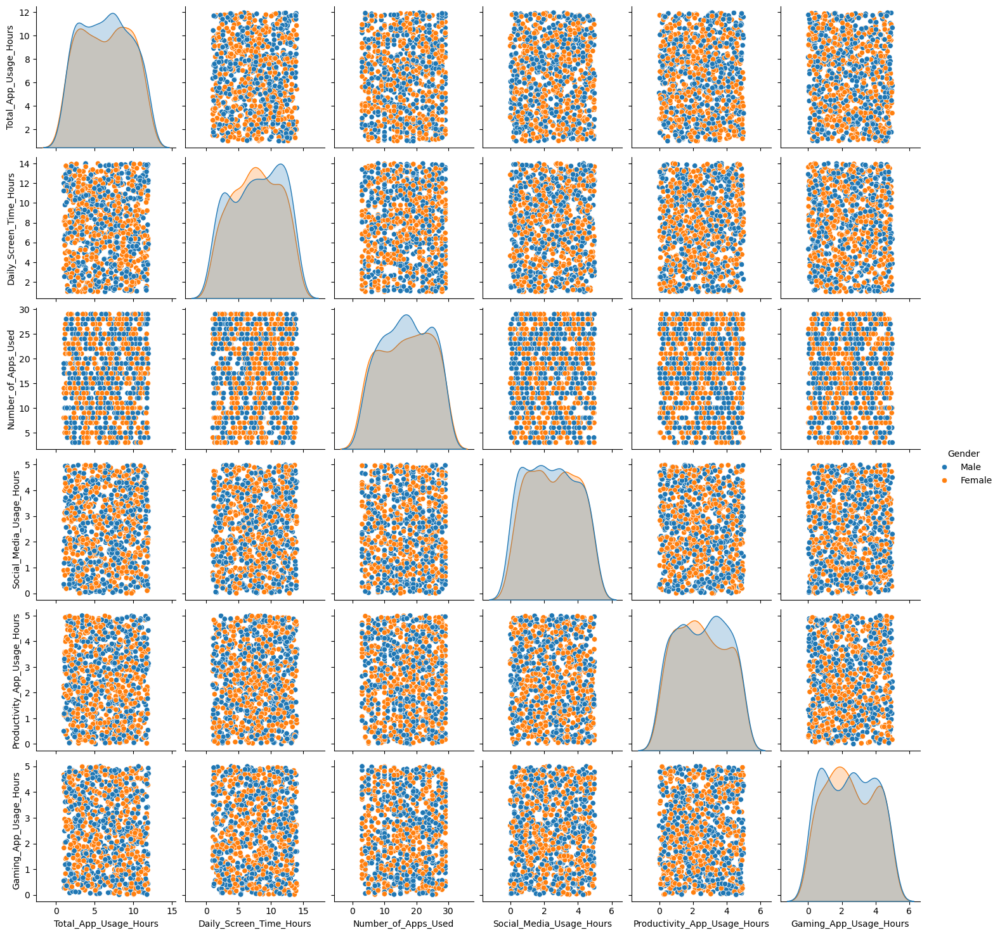

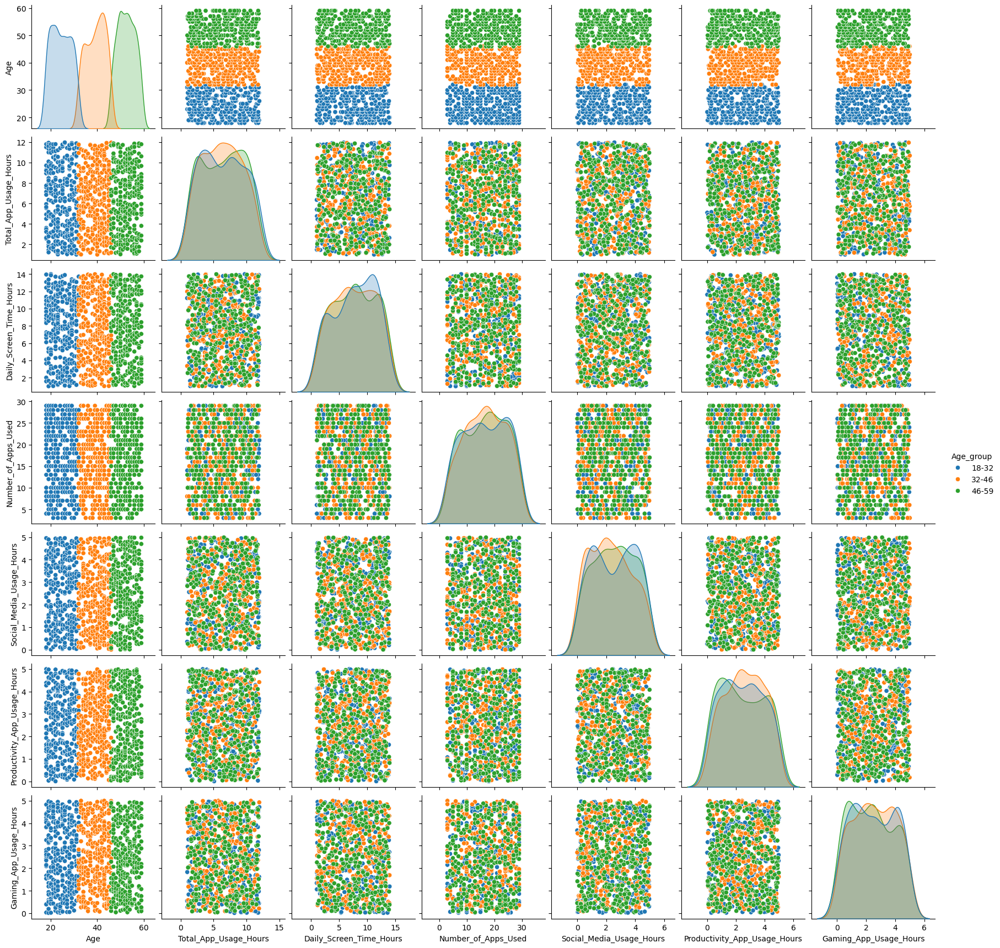

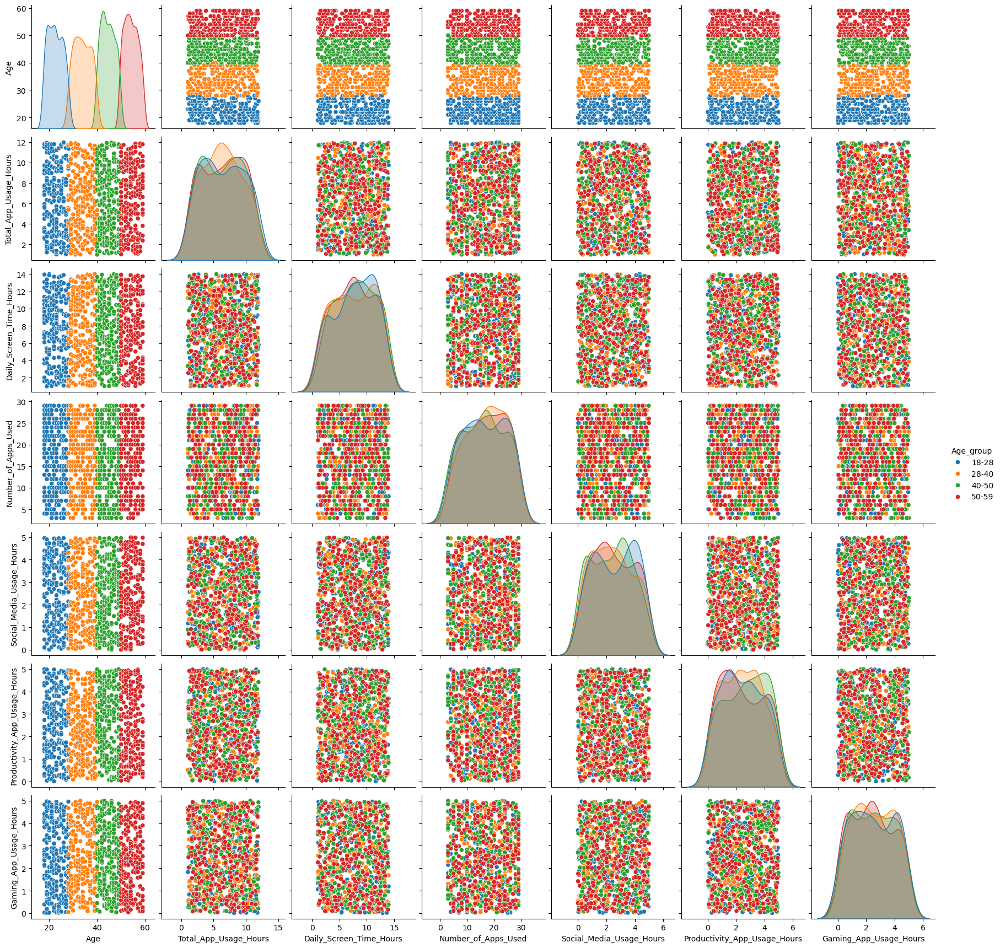

In [12]:
sns.pairplot(df.drop(columns=["User_ID", "Age", "Location"]), kind="scatter", hue="Gender")
df2 = divideIntoGroups_thenDrop(3, 333, "Age", "Age_group", df, ["User_ID", "Gender", "Location"]);  sns.pairplot(df2, kind="scatter", hue="Age_group")
df2 = divideIntoGroups_thenDrop(4, 250, "Age", "Age_group", df, ["User_ID", "Gender", "Location"]);  sns.pairplot(df2, kind="scatter", hue="Age_group")

Niestety bardzo trudno jest uzyskać jakiekolwiek sensowne informacje z macierzy wykresów punktówych. Nieważne, czy jako "hue" zostało ustawione 2,3,4,5,6 grup wiekowych, lokalizacja czy płeć, macierz wykresów punktowych pokazuje każdą parę jako równomierny rozkład w kształcie prostokąta (bez żadnych specyficznych kształtów, podziału na obszary skupienia itd). Szczególnie jeśli spojrzymy na pola skrzyżowane z atrybutem Age (celowo pozostawionym w celach poglądowych, pomimo ustawienia "hue" jako grup wiekowych), zobaczymy bardzo wyraźnie, że dla każdej grupy wiekowej rozkład pozostałych atrybutów rzeczywiście jest równomierny.
  
Poniżej są przykładowe próby uzyskania przydatnych informacji:  
  
Podział według przedziałów wiekowych:  
sns.pairplot(df2, kind="scatter", hue="Age_group"), gdzie sprawdzany był podział na 2,3,4,5,6 grup   
Podział według lokalizacji:  
sns.pairplot(df.drop(columns=["User_ID", "Gender"]), kind="scatter", hue="Location")  
Podział według płci:  
sns.pairplot(df.drop(columns=["User_ID", "Location"]), kind="scatter", hue="Gender")  

Niestety, wszystkie z nich skończyły się niepowodzeniem. Myśleliśmy nawet o częściowym "iloczynie kartezjańskim" (połączeniu kilku cech), aby uzyskać lepsze rozróżnienie, jednak ponieważ wszystkie z osobna dają dane wyglądające wręcz losowo, to nawet ich połączenie nie jest w stanie pomóc. Biorąc pod uwagę, że największa miara korelacji z macierzy korelacji wszystkich par atrybutów wynosiła około -0,076, można było się tego spodziewać, ale przynajmniej dało nam to możliwość spróbowania różnych podejść.

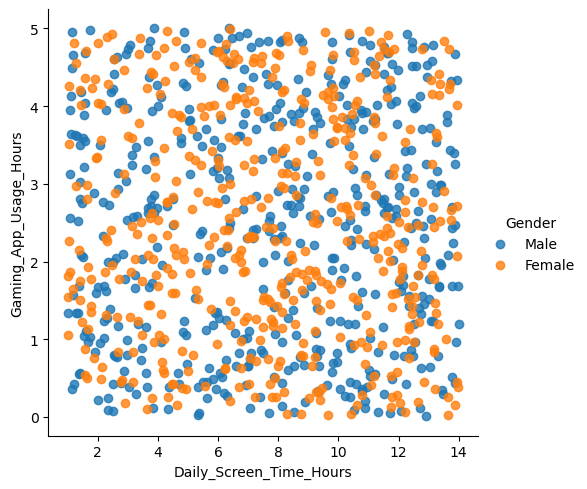

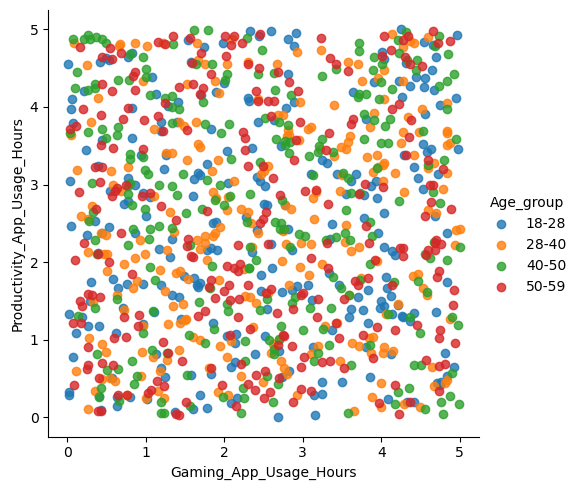

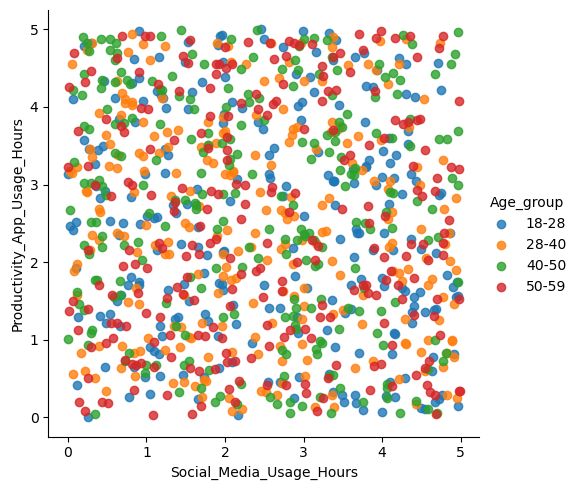

In [13]:
sns.lmplot(x="Daily_Screen_Time_Hours", y="Gaming_App_Usage_Hours", data=df.drop(columns=["User_ID","Age","Location"]), fit_reg=False, hue='Gender')
df2 = divideIntoGroups_thenDrop(4, 250, "Age", "Age_group", df, ["User_ID", "Gender", "Location"])
sns.lmplot(x="Gaming_App_Usage_Hours", y="Productivity_App_Usage_Hours", data=df2, fit_reg=False, hue='Age_group')
sns.lmplot(x="Social_Media_Usage_Hours", y="Productivity_App_Usage_Hours", data=df2, fit_reg=False, hue='Age_group')

Powyżej zostały przedstawione najciekawsze wykresy punktowe z macierzy. Tak jak było to już wspomniane wcześniej, opracowywany zbiór danych bardzo słabo nadaje się do wizualizacji. Pierwszy scatter plot pokazuje, że płęć w żaden sposób nie wpływa na całkowity dzienny czas spędzony przed ekranem, ani konkretnie na czas grania w gry. Z drugiego możemy dowiedzieć się, że czas spędzony przy komputerze na graniu w gry nie ma żadnego wpływu na czas spędzony przed ekranem produktywnie, a do tego obie te cechy mają wartości rozłożone równomiernie - bez względu na wiek. Trzeci (najniższy) scatter plot przedstawia parę o największej wartośc korelacji z całego zbioru, zatem pod względem zależności powinna być najbardziej interesująca - jednak na próżno doszukiwać się tutaj jakiś sensownych podziałów, możemy jedynie analogicznie do poprzedniego przypadku stwierdzić, że czas spędzony w mediach społecznościowych nie wydaje się być w żadnym stopniu powiązany z wiekiem lub czasem spędzonym przed ekranem produktywnie. 

#### Uczenie Maszynowe: 
Regresja wieku użytkownika: LinearRegression, SVM, DecisionTreeRegressor.  

In [15]:
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import pandas as pd

def podziel(df,proporcja):
    opis_ucz, opis_test, dec_ucz, dec_test = train_test_split(df.iloc[:,0:-1], df.iloc[:,-1], test_size=proporcja)#, random_state=0)
    return {"opis_ucz":opis_ucz, "opis_test":opis_test, "dec_ucz":dec_ucz, "dec_test":dec_test}
cols = [c for c in onlyNums.columns if c != 'Age'] + ['Age']
df_do_podzialu = onlyNums[cols]
dane = podziel(df_do_podzialu, 0.2)
X_train = dane["opis_ucz"]
X_test = dane["opis_test"]
y_train = dane["dec_ucz"]
y_test = dane["dec_test"]
models = {
    "Linear Regression": LinearRegression(),
    "SVM (SVR)": SVR(kernel='rbf'),
    "Decision Tree": DecisionTreeRegressor(random_state=42)
}
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mae = metrics.mean_absolute_error(y_test, y_pred)
    r2 = metrics.r2_score(y_test, y_pred)
    results[name] = {"MAE": mae, "R2 Score": r2}
results_df = pd.DataFrame(results).T
print(results_df)

NameError: name 'train_test_split' is not defined